# Intro

## Intro to Machine Learning

### Supervised
Input data is used to predict a label for that data. Predict a label based on inputs.
- Examples: Transaction data to label certain transactions as fraudulent

### Unsupervised
Clustering data based on common characteristics.
- No labels, they just get clumped together
- Grouping customer segments
- Grouping docs by topic

## Why Linear Regression

### Interpretability
LinReg models have clear levers for how the changes in the inputs might impact the result... depending on the number of conditions.
- LinReg is about isolating those components.

### Computational Efficiency
Vs. deep learning, LinReg or Logistic Regression (LogReg) can find a solution faster and with less resources

### Usefulness in Controlled Situations
When used in a real world scenario, it's often for experimental things, especially where high levels of control over variables is needed.
- Due to their simplicity, linreg/logreg models have limitations in the kinds of relationships b/w vars that can be captured.
- Still enable control over most of the vars and focus on answering specific questions.
- Lots of assumptions that might make results unactionable (assumptions are somewhat simplifying the problem)

# Regression

## Intro to LinReg

### Simple LinReg
Linear comparison w/two quantitative variables. We just care about the relationship between the two
- hours of studying vs test grades
- Often plotted as a scattered plot
- Variables X (explanatory var) and Y (response variable)
  - x is used to predict the response (we have control over this)
  - y is the thing we are interested in predicting
- We usually try to draw a line to fit the data

### Scatter Plots
- Used to view relationship between two variables
- Strength (closeness of points) and direction (positive or negative) of relationship
- **Correlation Coefficient** - strength and direction of a linear relationship (denoted by lowercase $r$)
  - Always between -1 and. Closer to 1 means stronger relationship. Negative tells you it's a negative relationship while a positive number tells you it's a positive relationship

  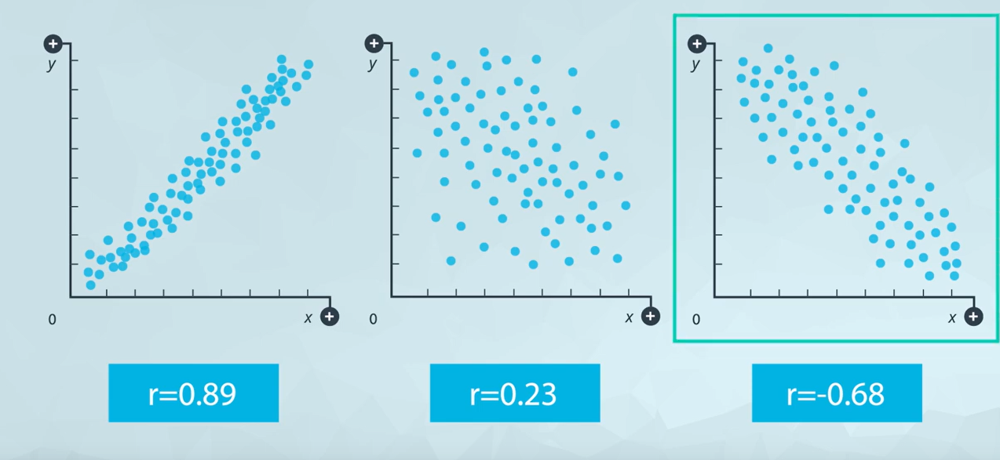

  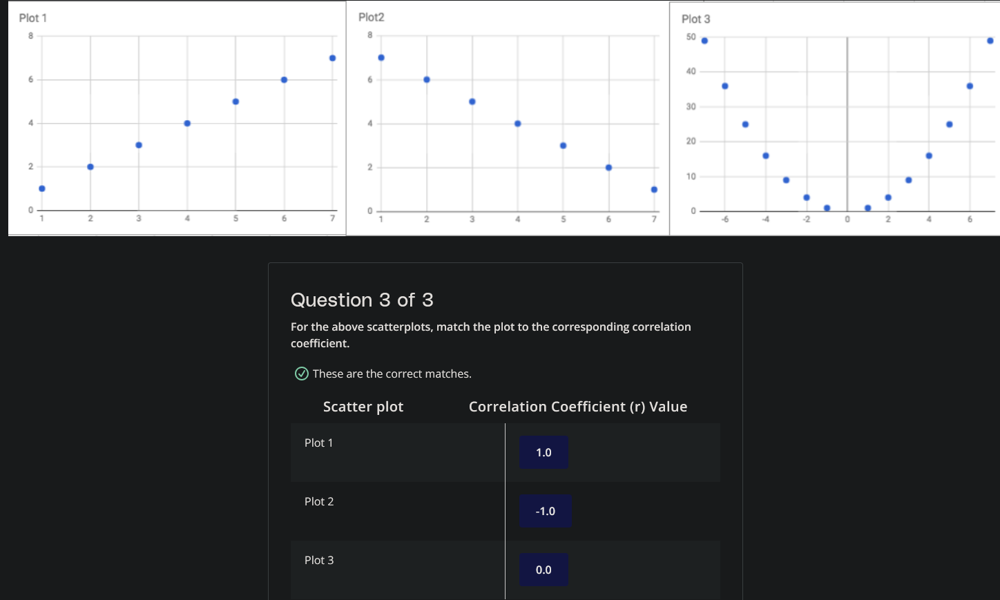

  - In the event you are for some reason applying Pearson's Correlation Coefficient to a quadratic (plot 3) it will be 0. PCC does not accomodate quadratics, it's simply for LINEAR relationships.

### Correlation Coeff

Equation below as well as definitions for strong, moderate, and weak relationships

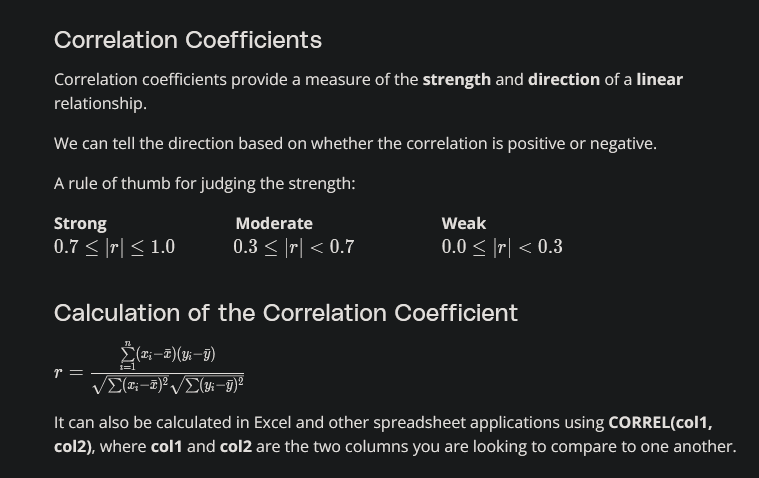

## Fitting a Line

defined by intercept (x=0) and slope (rise/run)

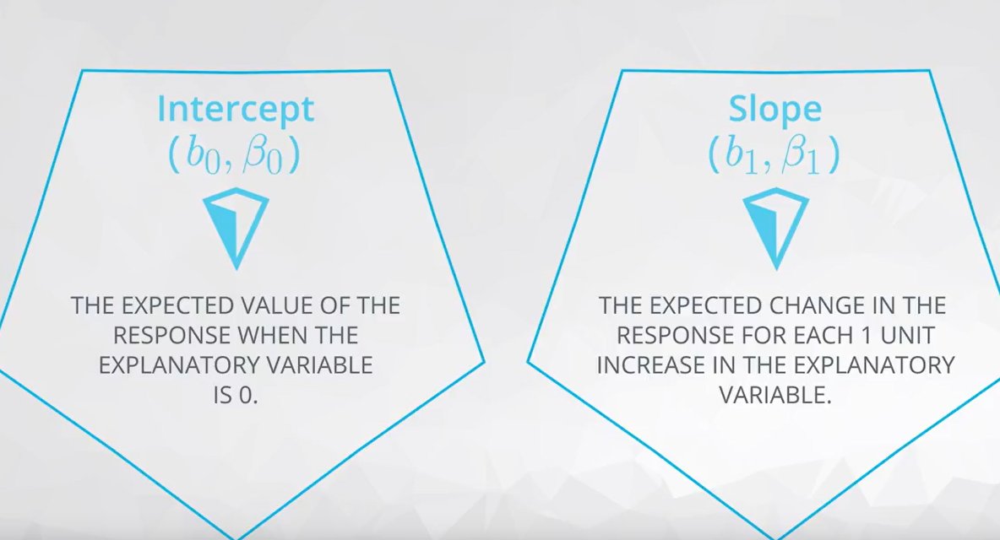

$\beta_1$ is for the parameter and $b_1$ is for the statistic

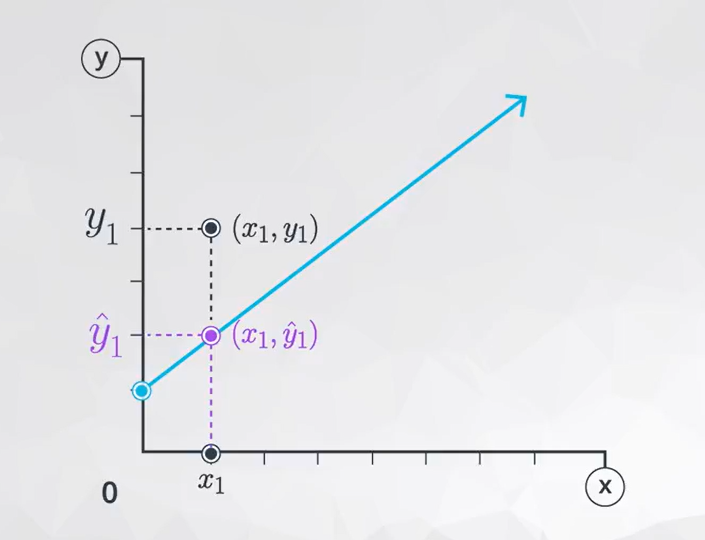

The little $\hat{y}_1$ (hat y) is used to denote/label that the point has the same x value as the x,y pair, but the y is not on the line, hence the hat (it means it's predicted)
- This is the predicted value of the response from the line

#### Least Squares Algorithm
Minimizes the sum of the squared vertical distances from the line to points (in order to draw a line of best fit)
- For each of the datapoints in the set, get the difference between actual and predicted, square it, then sum it all together.

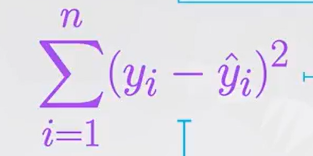

- This usually does a good job in most scenarios
- This is the function we want to minimize, though
 

## Intro to StatsModels

Lib for performing LinReg and much more

In [219]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

df = pd.read_csv('./datasets/house_price_area_only.csv')
df.head()

,price,area
0,598291,1188
1,1744259,3512
2,571669,1134
3,493675,1940
4,1101539,2208


In [220]:
df['intercept'] = 1  # add a column with the intercept (sm does not automatically do th is)

lm = sm.OLS(df['price'], df[['intercept', 'area']])  # linear model
results = lm.fit()  # fit the model with a line
results.summary()  # get a summary of the regression results

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.678
Method:                 Least Squares   F-statistic:                 1.269e+04
Date:                Fri, 27 Jun 2025   Prob (F-statistic):               0.00
Time:                        11:42:37   Log-Likelihood:                -84517.
No. Observations:                6028   AIC:                         1.690e+05
Df Residuals:                    6026   BIC:                         1.691e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   9587.8878   7637.479      1.255      0.209   -5384.303    2.46e+04
area         348.4664      3.093    112.662      0.000     342.403     354.530
==============================================================================
Omnibus:                      368.609   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              349.279
Skew:                           0.534   Prob(JB):                     1.43e-76
Kurtosis:                       2.499   Cond. No.                     4.93e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.93e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Interpretting the results

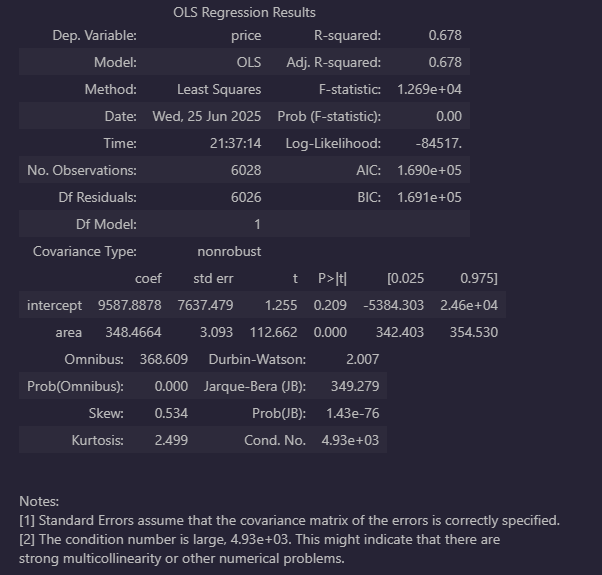

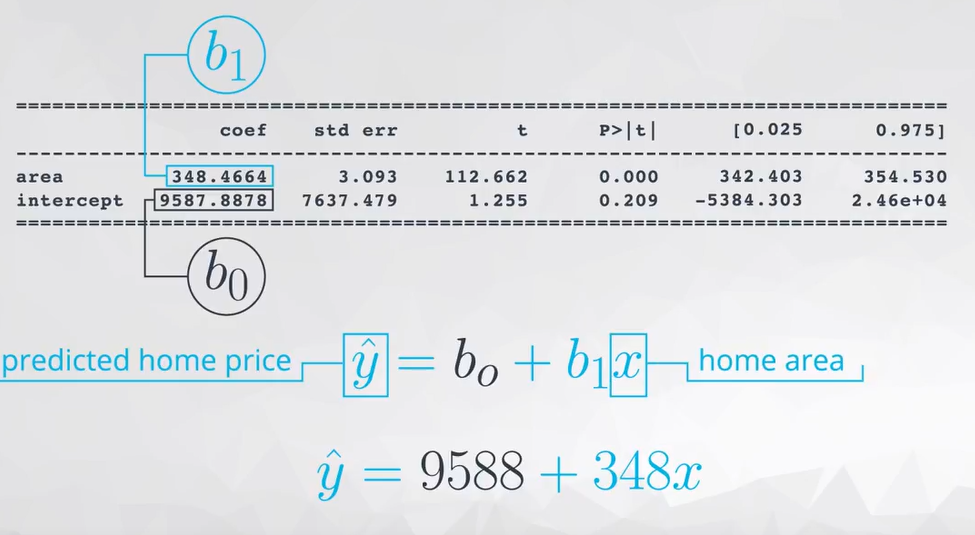

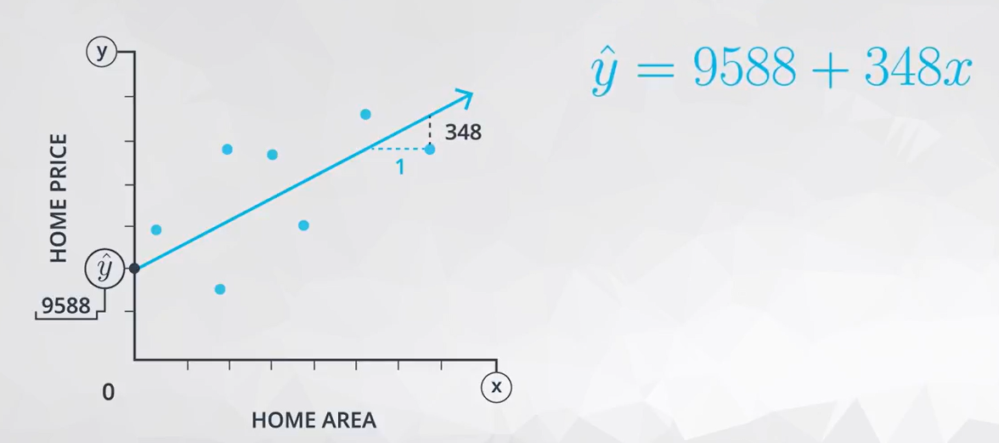

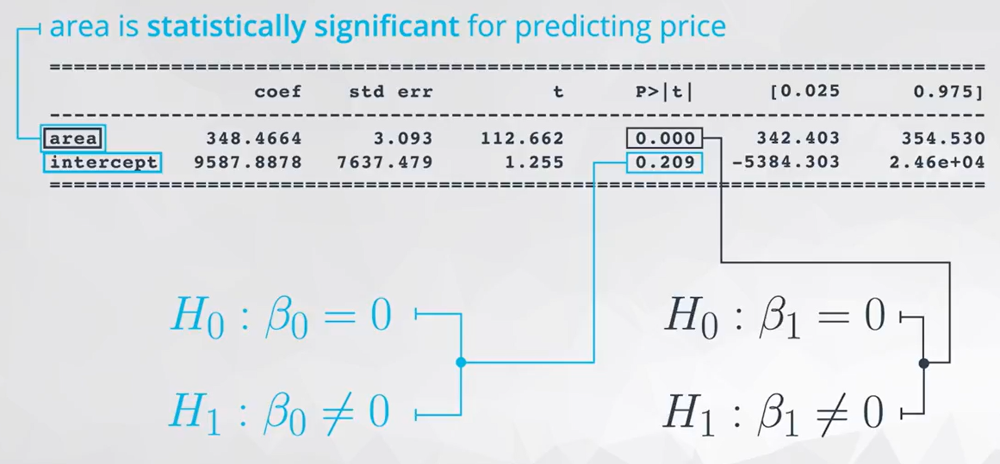

... These here are the 'P' values. In regression, 'P' values are always given for testing if the parameter forthe intercept or the slope are equal to zero and the null hypothesis, like this.

Then in the alternative, by default,Python and other software compute 'P' values using a not equal to. These 'P' values can give a quick glimpse as to whether or nota particular variable is useful for predicting the response.

The 'P' value here on the intercept isn't as useful as the one for area, which suggests that the area is statistically significant in relating to the price.

We can do hypothesis tests against the coefficients in the linear models. These help us figure out if the linear relationship between the var and the response is statistically significant
- The hypot test for the intercept isn't useful in most cases.


*However, the hypothesis test for each x-variable is a test of if that population slope is equal to zero vs. an alternative where the parameter differs from zero. Therefore, if the slope is different than zero (the alternative is true), we have evidence that the x-variable attached to that coefficient has a statistically significant linear relationship with the response. This in turn suggests that the x-variable should help us in predicting the response (or at least be better than not having it in the model).*

### Does the line fit well?
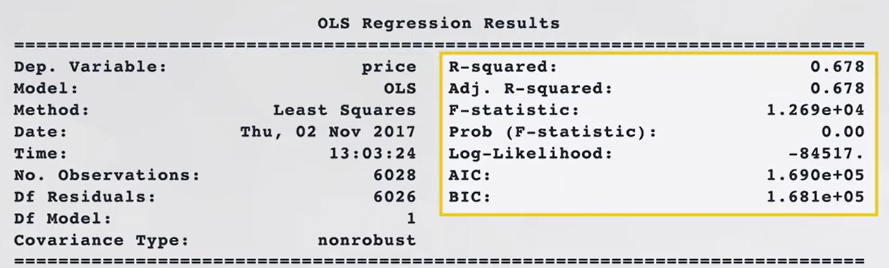

This part of the output is useful for understanding how well the line fits through the data
- R-Squared = closer to 1 is a better fit
  - just the square of the correlation coefficient
  - "the amount of variability in the response (y) that can be explained with the x-var"
  - This reads as "68.7% of the price is explained by the area of the house" - everything else is from external variables 
  - Using this value directly from the output **can be misleading**

### Examples

In [221]:
import numpy as np
import pandas as pd
import statsmodels.api as sms;
import matplotlib.pyplot as plt
%matplotlib inline

data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

df = pd.DataFrame()
df['MedianHomePrice'] = target
df2 = pd.DataFrame(data)
df['CrimePerCapita'] = df2.iloc[:,0];
df.head()

,MedianHomePrice,CrimePerCapita
0,24.0,0.00632
1,21.6,0.02731
2,34.7,0.02729
3,33.4,0.03237
4,36.2,0.06905


The Boston housing data is a built in dataset in the sklearn library of python.  You will be using two of the variables from this dataset, which are stored in **df**. The median home price in thousands of dollars and the crime per capita in the area of the home are shown above.

`1.` Use this dataframe to fit a linear model to predict the home price based on the crime rate.  Use your output to answer the first quiz below. Don't forget an intercept.

In [222]:
df['intercept'] = 1

X = df[['intercept', 'CrimePerCapita']]
y = df['MedianHomePrice']

mod = sm.OLS(y, X)
reg = mod.fit()
reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        MedianHomePrice   R-squared:                       0.151
Model:                            OLS   Adj. R-squared:                  0.149
Method:                 Least Squares   F-statistic:                     89.49
Date:                Fri, 27 Jun 2025   Prob (F-statistic):           1.17e-19
Time:                        11:42:38   Log-Likelihood:                -1798.9
No. Observations:                 506   AIC:                             3602.
Df Residuals:                     504   BIC:                             3610.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
intercept         24.0331      0.409     58.740      0.000      23.229      24.837
CrimePerCapita    -0.4152      0.044     -9.460      0.000      -0.501      -0.329
==============================================================================
Omnibus:                      139.832   Durbin-Watson:                   0.713
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              295.404
Skew:                           1.490   Prob(JB):                     7.14e-65
Kurtosis:                       5.264   Cond. No.                         10.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

`2.`Plot the relationship between the crime rate and median home price below.  Use your plot and the results from the first question as necessary to answer the remaining quiz questions below.

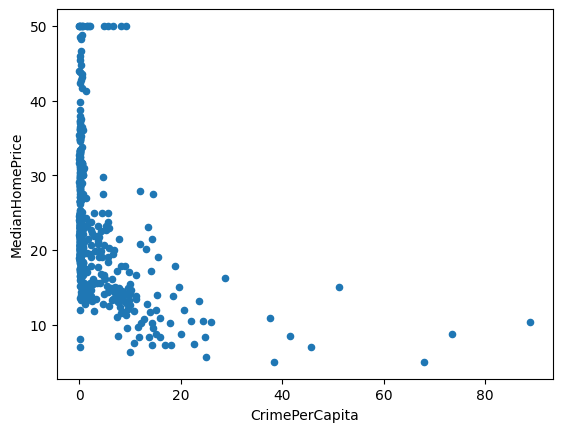

In [223]:
df.plot(kind='scatter', x='CrimePerCapita', y='MedianHomePrice');

# Multiple Linear Regression

Working w/multiple inputs, both quantitative and categorical x-vars

Previously, we would work with equations that looked like this:

$\hat{y} = b_0 + b_1x_1$

Equations like this will come from our efforts

$\hat{y} = b_0 + b_1x_1 + b_2x_2 + b_3x_3 + b_4x_4$

## Example 1

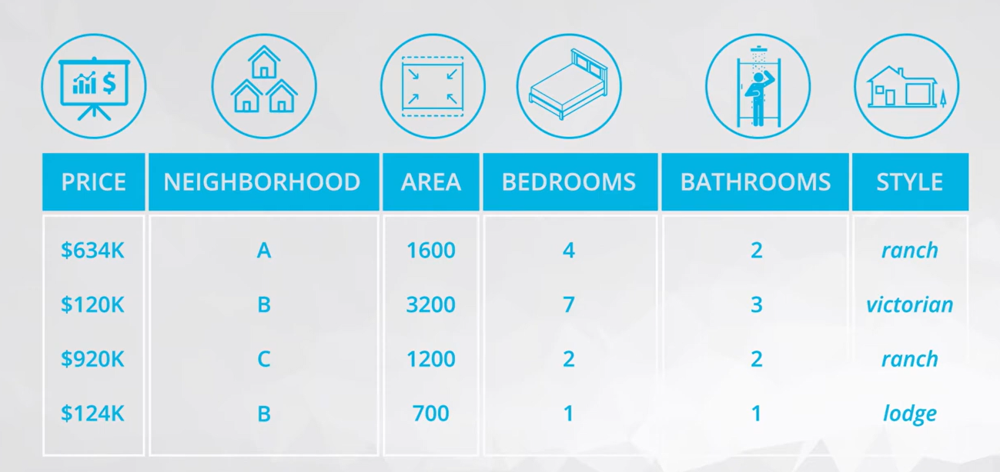

How do we use all of these columns? Linear algebra, where we make a matrix of inputs, like what's below

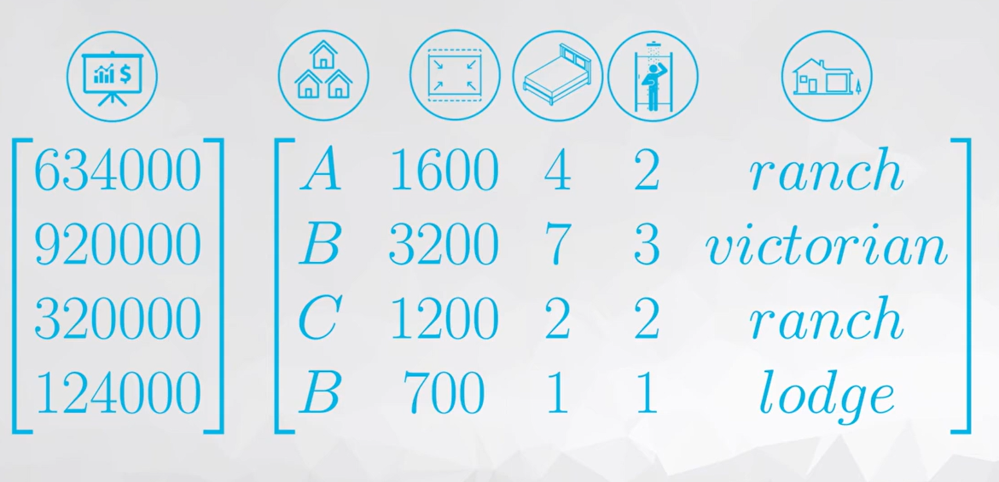

Then we create a vector. The response (y) is the price in this case while the x variable is the other factors, like style, bedrooms and bathrooms, etc.

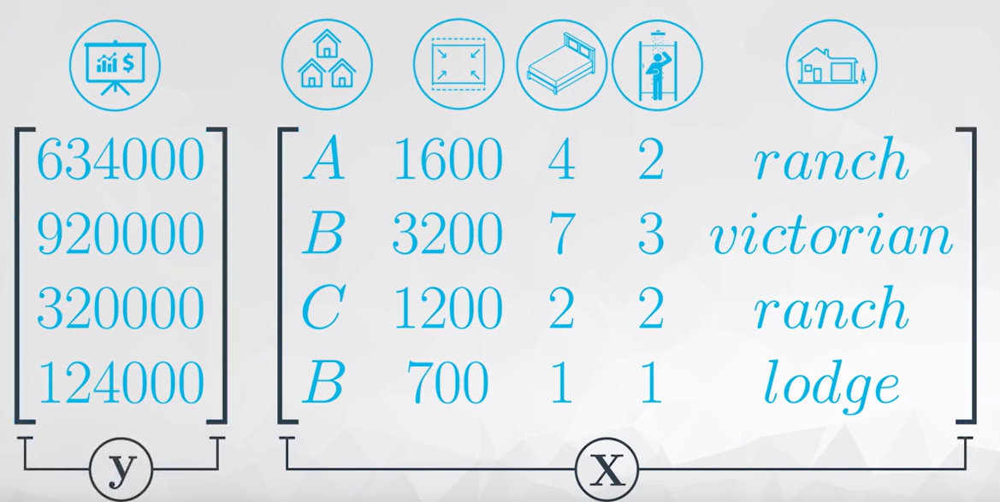

## Fitting a MLR Model

In [224]:
import numpy as np
import pandas as pd
import statsmodels.api as sm;

df = pd.read_csv('./datasets/house_prices.csv')
df.head()

,house_id,neighborhood,area,bedrooms,bathrooms,style,price
0,1112,B,1188,3,2,ranch,598291
1,491,B,3512,5,3,victorian,1744259
2,5952,B,1134,3,2,ranch,571669
3,3525,A,1940,4,2,ranch,493675
4,5108,B,2208,6,4,victorian,1101539


`1.` Using statsmodels, fit three individual simple linear regression models to predict price.  You should have a model that uses **area**, another using **bedrooms**, and a final one using **bathrooms**.  You will also want to use an intercept in each of your three models.

Use the results from each of your models to answer the first two quiz questions below.

In [225]:
df['intercept'] = 1

lm = sm.OLS(df['price'], df[['intercept', 'area']])
results = lm.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.678
Method:                 Least Squares   F-statistic:                 1.269e+04
Date:                Fri, 27 Jun 2025   Prob (F-statistic):               0.00
Time:                        11:42:38   Log-Likelihood:                -84517.
No. Observations:                6028   AIC:                         1.690e+05
Df Residuals:                    6026   BIC:                         1.691e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   9587.8878   7637.479      1.255      0.209   -5384.303    2.46e+04
area         348.4664      3.093    112.662      0.000     342.403     354.530
==============================================================================
Omnibus:                      368.609   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              349.279
Skew:                           0.534   Prob(JB):                     1.43e-76
Kurtosis:                       2.499   Cond. No.                     4.93e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.93e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [226]:
lm = sm.OLS(df['price'], df[['intercept', 'bedrooms']])
results = lm.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.553
Model:                            OLS   Adj. R-squared:                  0.553
Method:                 Least Squares   F-statistic:                     7446.
Date:                Fri, 27 Jun 2025   Prob (F-statistic):               0.00
Time:                        11:42:38   Log-Likelihood:                -85509.
No. Observations:                6028   AIC:                         1.710e+05
Df Residuals:                    6026   BIC:                         1.710e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -9.485e+04   1.08e+04     -8.762      0.000   -1.16e+05   -7.36e+04
bedrooms    2.284e+05   2646.744     86.289      0.000    2.23e+05    2.34e+05
==============================================================================
Omnibus:                      967.118   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1599.431
Skew:                           1.074   Prob(JB):                         0.00
Kurtosis:                       4.325   Cond. No.                         10.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [227]:
lm = sm.OLS(df['price'], df[['intercept', 'bathrooms']])
results = lm.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.541
Model:                            OLS   Adj. R-squared:                  0.541
Method:                 Least Squares   F-statistic:                     7116.
Date:                Fri, 27 Jun 2025   Prob (F-statistic):               0.00
Time:                        11:42:38   Log-Likelihood:                -85583.
No. Observations:                6028   AIC:                         1.712e+05
Df Residuals:                    6026   BIC:                         1.712e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   4.314e+04   9587.189      4.500      0.000    2.43e+04    6.19e+04
bathrooms   3.295e+05   3905.540     84.358      0.000    3.22e+05    3.37e+05
==============================================================================
Omnibus:                      915.429   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1537.531
Skew:                           1.010   Prob(JB):                         0.00
Kurtosis:                       4.428   Cond. No.                         5.84
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

`2.` Now that you have looked at the results from the simple linear regression models, let's try a multiple linear regression model using all three of these variables  at the same time.  You will still want an intercept in this model.

In [228]:
# sm.OLS(df['what-to-predict'], df[['factor1', ...]]])
lm = sm.OLS(df['price'], df[['intercept', 'bathrooms', 'bedrooms', 'area']])
# Adding the categorical vars will cause problems

results = lm.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.678
Method:                 Least Squares   F-statistic:                     4230.
Date:                Fri, 27 Jun 2025   Prob (F-statistic):               0.00
Time:                        11:42:38   Log-Likelihood:                -84517.
No. Observations:                6028   AIC:                         1.690e+05
Df Residuals:                    6024   BIC:                         1.691e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.007e+04   1.04e+04      0.972      0.331   -1.02e+04    3.04e+04
bathrooms   7345.3917   1.43e+04      0.515      0.607   -2.06e+04    3.53e+04
bedrooms   -2925.8063   1.03e+04     -0.285      0.775    -2.3e+04    1.72e+04
area         345.9110      7.227     47.863      0.000     331.743     360.079
==============================================================================
Omnibus:                      367.658   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              350.116
Skew:                           0.536   Prob(JB):                     9.40e-77
Kurtosis:                       2.503   Cond. No.                     1.16e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.16e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## How does it work?

How to find the "right" coefficients in MLR by using the "Regression Closed Form Solution":

*Beta hat = inverse of (X matrix transposed multiplied by X matrix) times X matrix transposed times y matrix*
- *When multiplying matrices, we must use the dot product*

$
\hat{\beta} = (X^′X)^{-1}X^′y
$

Statsmodels does this for us, yay. That's how it calculates the coefficients for each of the x-vars we pass it

Coefficients can have positive and negative values. Therefore, we can interpret **each coefficient as the predicted increase or decrease in the response for every one-unit increase** in the explanatory variable, **holding all other variables in the model constant**.

Just add the phrase "**holding all other variables constant**"

### Slope Interpretation
For every one unit increase of x, the expected y increases by the slope (holding all other vars constant)

Significant relationships (low p-values) between two variables are not always significant in MLR

### Adding Categorical Variables: Dummy Variables
- For each thing a categorical var can be, encode 1 and 0.
  - Create a column for each level of a category (A, B, C in the case below) and if it is present, add a 1 into that column.

  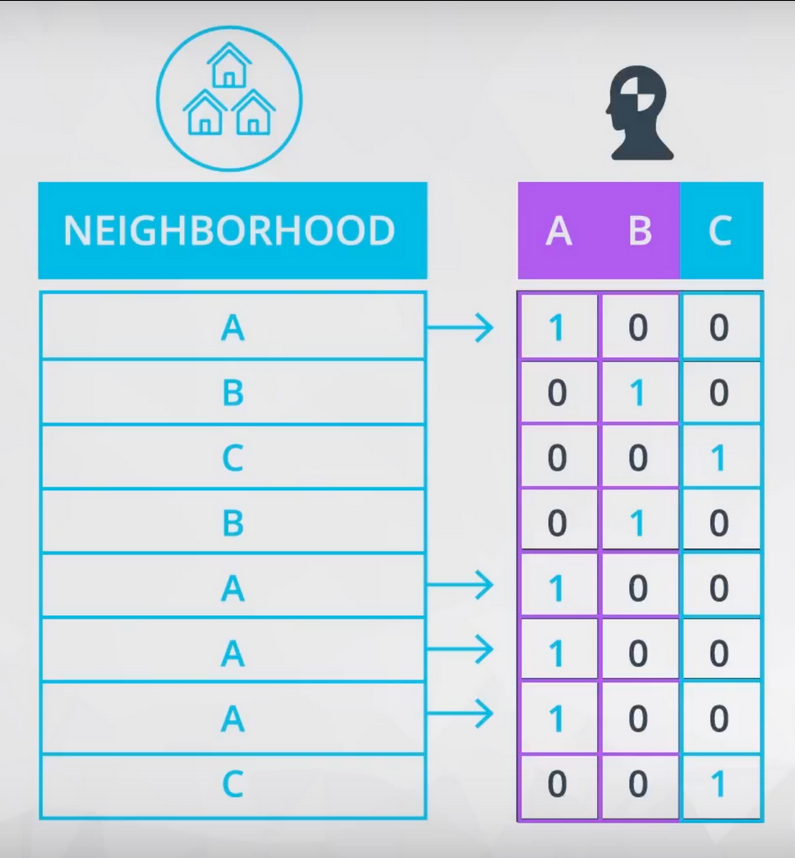

- We can infer the last column (i.e. a given row has 0, 0 so the 3rd value is implied, assuming it is not empty or another thing)
  - Basically, it becomes sort of like a default case for a switch statement. If it doesn't happen to hit true on any of the previous values, then it's the last one.
  - Because of this, we **ALWAYS drop one of the columns.**
    - **The column that is dropped is called the baseline.**
    - The coeffs you get from the output of your MLR models are an indication of how the encoded levels compare to the baseline level

### Math behind Dummy Variables
- To make matrices full rank, drop one of the dummy columns
  - To be able to make the inverse of $(X'X)$, the X matrix must be full rank (all columns of X must be linearly independent)


If you do not drop one of the columns (from the model, not from the dataframe) when creating the dummy variables, your solution is unstable, and results from Python are unreliable. You will see an example of what happens if you do not drop one of the dummy columns in the next concept.

The takeaway is ... when you create dummy variables using 0, 1 encodings, you always need to drop one of the columns from the model to make sure your matrices are full rank (and that your solutions are reliable from Python).


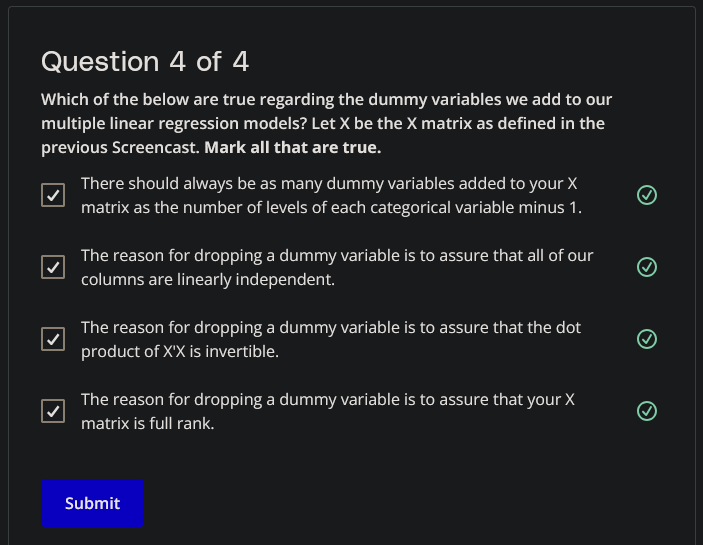

In [229]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

df = pd.read_csv('./datasets/house_prices.csv')
df.head()

,house_id,neighborhood,area,bedrooms,bathrooms,style,price
0,1112,B,1188,3,2,ranch,598291
1,491,B,3512,5,3,victorian,1744259
2,5952,B,1134,3,2,ranch,571669
3,3525,A,1940,4,2,ranch,493675
4,5108,B,2208,6,4,victorian,1101539


To get some dummy variables, you will use `pandas.get_dummies`. This will return back the columns you pass in alphabetical order.

In [230]:
pd.get_dummies(df['neighborhood'], dtype=int).head()  # maybe an -ism with my environment, but it shows up as "True" and "False" instead of 1 and 0

,A,B,C
0,0,1,0
1,0,1,0
2,0,1,0
3,1,0,0
4,0,1,0


In [231]:
df[["A", "B", "C"]] = pd.get_dummies(df['neighborhood'], dtype=int)# this will let us store the output above in our dataframe
df[['lodge', 'ranch', 'victorian']] = pd.get_dummies(df['style'], dtype=int)

# Not having the int casting was causing a type error

In [232]:
df['intercept'] = 1

lm = sm.OLS(df['price'], df[['intercept', 'lodge', 'ranch']])  # here we "drop" the 'victorian' col, as it will be inferred. The intercept's predicted coeff, std err, p-value, etc. will be for this col
results = lm.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.339
Model:                            OLS   Adj. R-squared:                  0.339
Method:                 Least Squares   F-statistic:                     1548.
Date:                Fri, 27 Jun 2025   Prob (F-statistic):               0.00
Time:                        11:42:38   Log-Likelihood:                -86683.
No. Observations:                6028   AIC:                         1.734e+05
Df Residuals:                    6025   BIC:                         1.734e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.046e+06   7775.607    134.534      0.000    1.03e+06    1.06e+06
lodge      -7.411e+05   1.44e+04    -51.396      0.000   -7.69e+05   -7.13e+05
ranch       -4.71e+05   1.27e+04    -37.115      0.000   -4.96e+05   -4.46e+05
==============================================================================
Omnibus:                     1340.120   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3232.810
Skew:                           1.230   Prob(JB):                         0.00
Kurtosis:                       5.611   Cond. No.                         3.28
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The predictions in the table above for coefficient, standard error, etc. has 3 categories
- `intercept` = baseline variable (in this case, the house being a `victorian` style)
- `lodge` = lodge-style home
- `ranch` = ranch-style home

Keep in mind that if `lodge` had a positive coef, that would mean that it would be a generally more expensive house than the intercept (everything there is in relation to the intercept)
- So, basically, the `-7.411e+05` means that is how much below the baseline (`victorian`) `lodge`-style homes are. Another explanation is below

*Each of the coefficients is a comparison of the category to the baseline. Therefore, a positive coefficient suggests the neighborhood is more expensive on average than the baseline. Alternatively, a negative coefficient suggests that the neighborhood is less expensive on average than the baseline.*

Also be sure to **compare predicted confidence intervals** between the variables to see how "statistically significant the average homeprice for a lodge differs from the average home price of a ranch." The P-values are all in comparison to the intercept/baseline.

# Logistic Regression

## Intro

Predicting a categorical response instead of a quantitative response (like with LinReg and MLR).

Only predicts 2 possible outcomes, so do things that only want that.
- Fraud or not
- Click or not
- Default on loan or not
- etc.

## Fitting Logistic Regression

We can bound our response to something between 0 and 1, rather than negative infinity to infinity

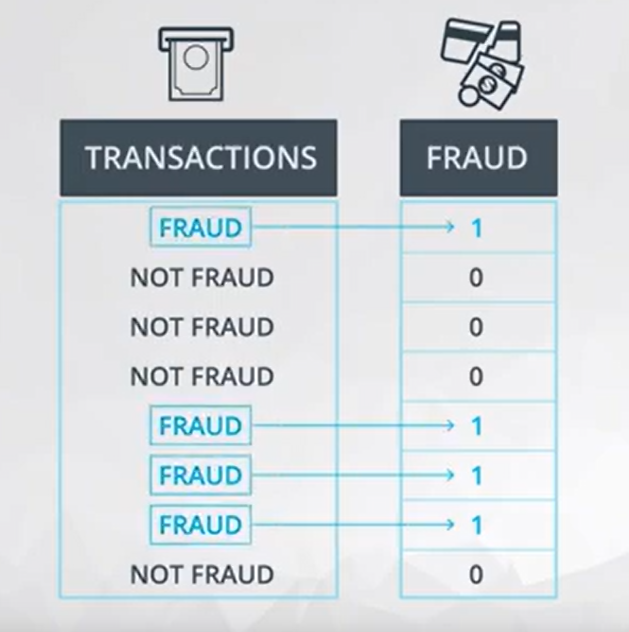

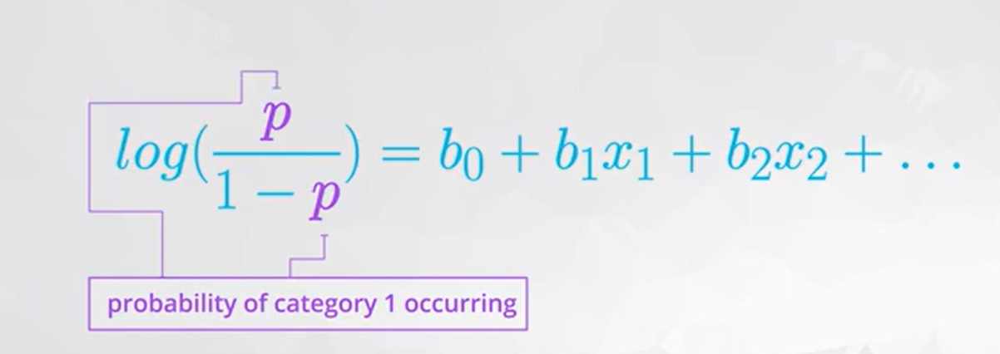

taking the $log$ of the "odds" ($\frac{p}{1-p}$) above allows us to keep the predictions b/w 1 and 0

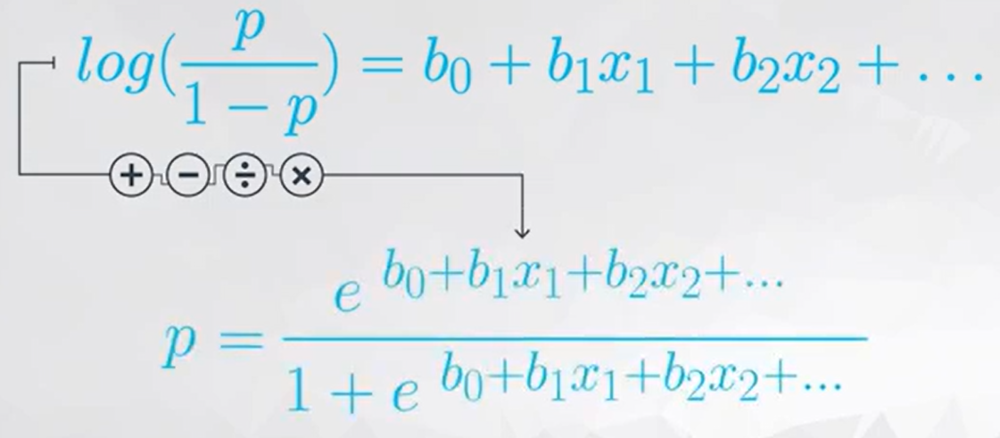

We can do some simple algebra to get the equation above in order to solve for the probability directly.

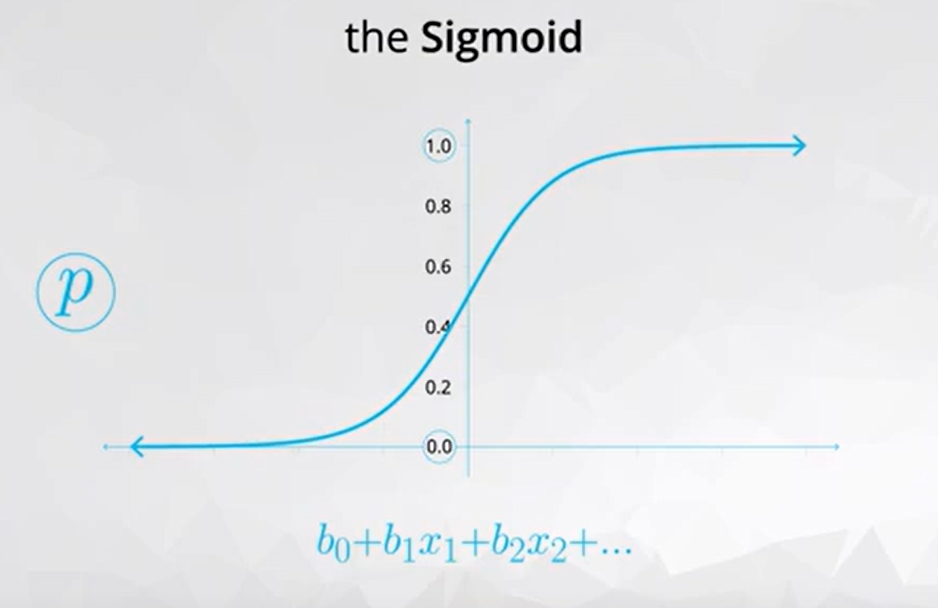

The Sigmoid function takes the value from your linreg line and maps it between 0 and 1 as a probability

### In Python

It's pretty similar as before

In [233]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

df = pd.read_csv('./datasets/fraud_dataset.csv')
df.head()

,transaction_id,duration,day,fraud
0,28891,21.302600,weekend,False
1,61629,22.932765,weekend,False
2,53707,32.694992,weekday,False
3,47812,32.784252,weekend,False
4,43455,17.756828,weekend,False


In [234]:
df.describe()

,transaction_id,duration
count,8793.000000,8793.000000
mean,55243.384510,29.704626
std,21792.120147,7.464452
min,17301.000000,0.215113
25%,36454.000000,25.211787
50%,55420.000000,29.923160
75%,74131.000000,34.532567
max,92828.000000,60.412763


In [235]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8793 entries, 0 to 8792
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   transaction_id  8793 non-null   int64  
 1   duration        8793 non-null   float64
 2   day             8793 non-null   object 
 3   fraud           8793 non-null   bool   
dtypes: bool(1), float64(1), int64(1), object(1)
memory usage: 214.8+ KB


We still have to set some dummies to use the categorical variables, so lets do that.

In [236]:
# another way to do it
# df['fraud'] = pd.get_dummies(df['fraud'], dtype=int).iloc[:, 1]
df[['not_fraud','fraud']] = pd.get_dummies(df['fraud'], dtype=int)
df = df.drop('not_fraud', axis=1)  # this is the baseline, so I guess we'll just drop it.
df.head()

,transaction_id,duration,day,fraud
0,28891,21.302600,weekend,0
1,61629,22.932765,weekend,0
2,53707,32.694992,weekday,0
3,47812,32.784252,weekend,0
4,43455,17.756828,weekend,0


Adding another column where we factor in if the day was on a weekday.

In [237]:
pd.get_dummies(df.day, dtype=int).head(1)  # we just want the "weekday" column

,weekday,weekend
0,0,1


In [238]:
df['weekday'] = pd.get_dummies(df.day, dtype=int)['weekday']

In [239]:
df['intercept'] = 1  # just 1's as a placeholder

# here we use .Logit instead of .OLS
logit_mod = sm.Logit(df['fraud'], df[['intercept', 'weekday', 'duration']])   # predict fraud based on duration and baseline
results = logit_mod.fit()
results.summary2()  # be sure to use summary2() for logistic regression

Optimization terminated successfully.
         Current function value: 0.002411
         Iterations 16


<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: Logit
==================================================================
Model:              Logit            Method:           MLE        
Dependent Variable: fraud            Pseudo R-squared: 0.963      
Date:               2025-06-27 11:42 AIC:              48.4009    
No. Observations:   8793             BIC:              69.6460    
Df Model:           2                Log-Likelihood:   -21.200    
Df Residuals:       8790             LL-Null:          -578.10    
Converged:          1.0000           LLR p-value:      1.3900e-242
No. Iterations:     16.0000          Scale:            1.0000     
-------------------------------------------------------------------
                Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
-------------------------------------------------------------------
intercept       9.8709    1.9438   5.0783  0.0000   6.0613  13.6806
weekday         2.5465    0.9043   2.8160  0.0049   0.7741   4.3188
duration       -1.4637    0.2905  -5.0389  0.0000  -2.0331  -0.8944
==================================================================

"""

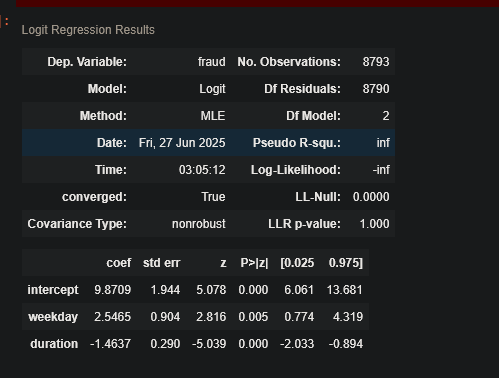

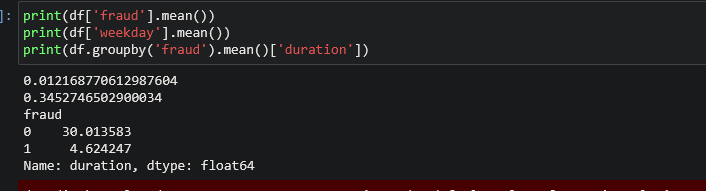

## Interpreting Results

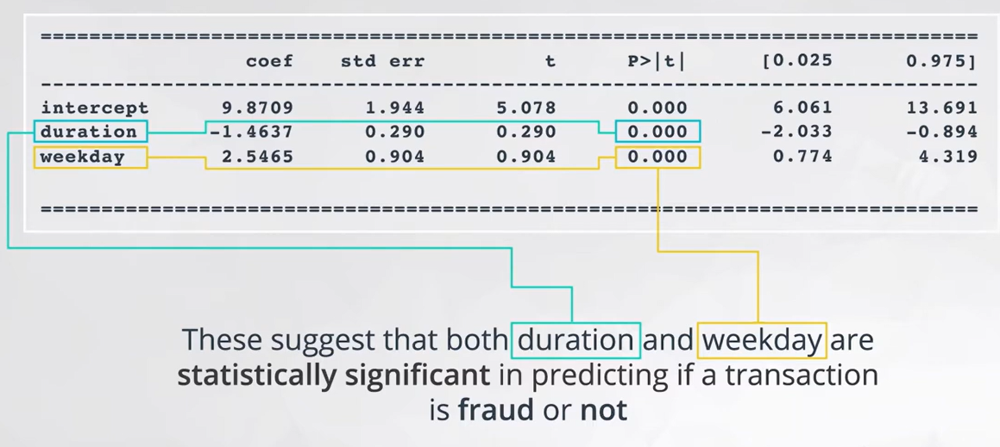

Coeffs are different, though

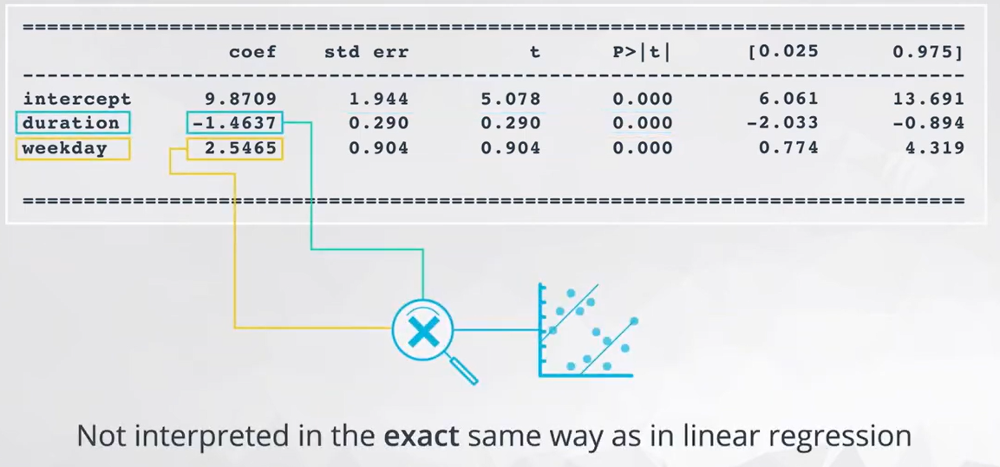

**Quantitative Interpretations** - for every 1 unit increase in explanatory var $x_1$, we expect a multiplicative change in the odds of being in the 1 category (True) of the exponential of the coeff ($e^{b_1}$) while keeping all other vars constant

**Categorical Interpretations** - When in category $x_1$, we expect a multiplicative change in the odds of being in the 1 category (True) by ($e^{b_1}$) compared to the baseline (holding all other vars constant)

Now lets care about the coefs

In [240]:
df['intercept'] = 1  # just 1's as a placeholder

# here we use .Logit instead of .OLS
logit_mod = sm.Logit(df['fraud'], df[['intercept', 'weekday', 'duration']])   # predict fraud based on duration and baseline
results = logit_mod.fit()
results.summary2()  # be sure to use summary2() for logistic regression

Optimization terminated successfully.
         Current function value: 0.002411
         Iterations 16


<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: Logit
==================================================================
Model:              Logit            Method:           MLE        
Dependent Variable: fraud            Pseudo R-squared: 0.963      
Date:               2025-06-27 11:42 AIC:              48.4009    
No. Observations:   8793             BIC:              69.6460    
Df Model:           2                Log-Likelihood:   -21.200    
Df Residuals:       8790             LL-Null:          -578.10    
Converged:          1.0000           LLR p-value:      1.3900e-242
No. Iterations:     16.0000          Scale:            1.0000     
-------------------------------------------------------------------
                Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
-------------------------------------------------------------------
intercept       9.8709    1.9438   5.0783  0.0000   6.0613  13.6806
weekday         2.5465    0.9043   2.8160  0.0049   0.7741   4.3188
duration       -1.4637    0.2905  -5.0389  0.0000  -2.0331  -0.8944
==================================================================

"""

In [241]:
np.exp(-1.4637), np.exp(2.5465)  # we don't care about the intercept

# for the weekday dummy var, we say that fraud is 12.76 times as likely on weekdays than weekends (holding all else constant)
# for duration, for each 1 unit increase, fraud is .23 times as likely (holding all else constant) -- that's a weird way to phrase it.

(np.float64(0.2313785882117941), np.float64(12.762357271496972))

With returned values less than 1 (like 0.23), we should take the recipricol to get the unit decrease instead of the unit increase

In [242]:
1/np.exp(-1.4637)  # for each 1 unit DECREASE in duration, fraud is 4.32 times as likely (holding all else constant)
# basically, the less time, the more likely it's fraudulent

np.float64(4.321921089278333)

### More interpretation

#### Interpreting Results of Logistic Regression

In this notebook (and quizzes), you will be getting some practice with interpreting the coefficients in logistic regression.  Using what you saw in the previous video should be helpful in assisting with this notebook.

The dataset contains four variables: `admit`, `gre`, `gpa`, and `prestige`:

* `admit` is a binary variable. It indicates whether or not a candidate was admitted into UCLA (admit = 1) our not (admit = 0).
* `gre` is the GRE score. GRE stands for Graduate Record Examination.
* `gpa` stands for Grade Point Average.
* `prestige` is the prestige of an applicant alta mater (the school attended before applying), with 1 being the highest (highest prestige) and 4 as the lowest (not prestigious).

To start, let's read in the necessary libraries and data.

In [243]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

df = pd.read_csv("./datasets/admissions.csv")
df.head()

,admit,gre,gpa,prestige
0,0,380,3.61,3
1,1,660,3.67,3
2,1,800,4.00,1
3,1,640,3.19,4
4,0,520,2.93,4


There are a few different ways you might choose to work with the `prestige` column in this dataset.  For this dataset, we will want to allow for the change from prestige 1 to prestige 2 to allow a different acceptance rate than changing from prestige 3 to prestige 4.

1. With the above idea in place, create the dummy variables needed to change prestige to a categorical variable, rather than quantitative, then answer quiz 1 below.

In [244]:
df[['p1','p2', 'p3', 'p4']] = pd.get_dummies(df['prestige'], dtype=int)
df.head()

,admit,gre,gpa,prestige,p1,p2,p3,p4
0,0,380,3.61,3,0,0,1,0
1,1,660,3.67,3,0,0,1,0
2,1,800,4.00,1,1,0,0,0
3,1,640,3.19,4,0,0,0,1
4,0,520,2.93,4,0,0,0,1


In [245]:
print(df['prestige'].mode()[0])
df['prestige'].value_counts()


2


prestige
2    148
3    121
4     67
1     61
Name: count, dtype: int64

`2.` Now, fit a logistic regression model to predict if an individual is admitted using `gre`, `gpa`, and `prestige` with a baseline of the prestige value of `1`.  Use the results to answer quiz 2 and 3 below.  Don't forget an intercept. Remember to use the `.summary2()` method to get your summary results.

In [246]:
df['intercept'] = 1


logit_mod = sm.Logit(df['admit'], df[['intercept', 'gre', 'gpa', 'p2', 'p3','p4']])   # "drop" p1 to use as intercept
results = logit_mod.fit()
results.summary2()

Optimization terminated successfully.
         Current function value: 0.573854
         Iterations 6


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Method:           MLE       
Dependent Variable: admit            Pseudo R-squared: 0.082     
Date:               2025-06-27 11:42 AIC:              467.6399  
No. Observations:   397              BIC:              491.5435  
Df Model:           5                Log-Likelihood:   -227.82   
Df Residuals:       391              LL-Null:          -248.08   
Converged:          1.0000           LLR p-value:      1.1761e-07
No. Iterations:     6.0000           Scale:            1.0000    
------------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
------------------------------------------------------------------
intercept     -3.8769    1.1425  -3.3934  0.0007  -6.1161  -1.6376
gre            0.0022    0.0011   2.0280  0.0426   0.0001   0.0044
gpa            0.7793    0.3325   2.3438  0.0191   0.1276   1.4311
p2            -0.6801    0.3169  -2.1459  0.0319  -1.3013  -0.0589
p3            -1.3387    0.3449  -3.8819  0.0001  -2.0146  -0.6628
p4            -1.5534    0.4175  -3.7211  0.0002  -2.3716  -0.7352
=================================================================

"""

All variables are statistically significant because their values are `< 0.05`

In [247]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  admit   No. Observations:                  397
Model:                          Logit   Df Residuals:                      391
Method:                           MLE   Df Model:                            5
Date:                Fri, 27 Jun 2025   Pseudo R-squ.:                 0.08166
Time:                        11:42:39   Log-Likelihood:                -227.82
converged:                       True   LL-Null:                       -248.08
Covariance Type:            nonrobust   LLR p-value:                 1.176e-07
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -3.8769      1.142     -3.393      0.001      -6.116      -1.638
gre            0.0022      0.001      2.028      0.043    7.44e-05       0.004
gpa            0.7793      0.333      2.344      0.019       0.128       1.431
p2            -0.6801      0.317     -2.146      0.032      -1.301      -0.059
p3            -1.3387      0.345     -3.882      0.000      -2.015      -0.663
p4            -1.5534      0.417     -3.721      0.000      -2.372      -0.735
==============================================================================
"""

Remember that you have to take the exp() of the coef to be able to interpret it! 

In [248]:
np.exp(results.params)

intercept    0.020716
gre          1.002221
gpa          2.180027
p2           0.506548
p3           0.262192
p4           0.211525
dtype: float64

To compare the least prestigious to the most prestigious in this way, you will need to take 1 divided by the exponential of the coefficient.

In [249]:
1/_ # inverse

intercept    48.272116
gre           0.997784
gpa           0.458710
p2            1.974147
p3            3.813995
p4            4.727566
dtype: float64

In [250]:
df.groupby('prestige').mean()['admit']

prestige
1    0.540984
2    0.358108
3    0.231405
4    0.179104
Name: admit, dtype: float64

## Model Diagnostics + Perf Metrics

Measuring how well a model fits is done by taking the "accuracy"

Accuracy = number of correct labels / number of rows

This won't work well when you have unbalanced datasets (lots of non-fraud vs. a couple fraud transaction)

## Confusion Matrices

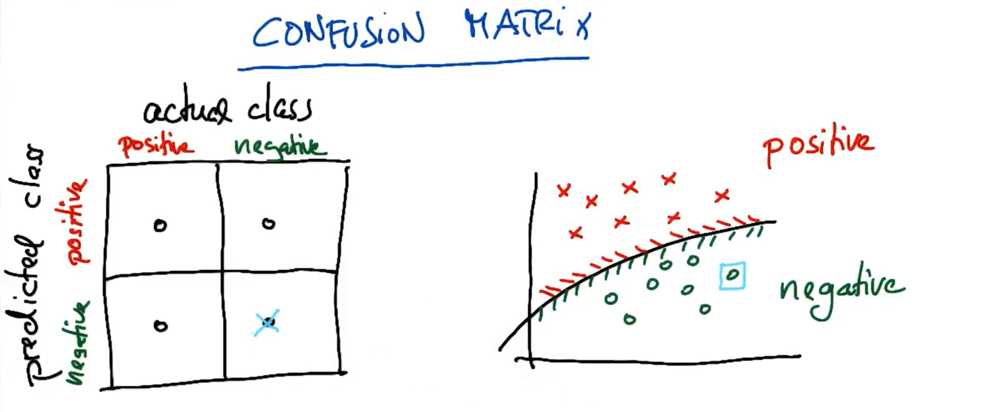

The matrix has every possibility for the predicted classification versus the actual classification. The graph's green portion indicates they were classified as negative. The circle indicates that the item was actually negative and the fact that it is under the line indicates it was also classified by the model as negative.

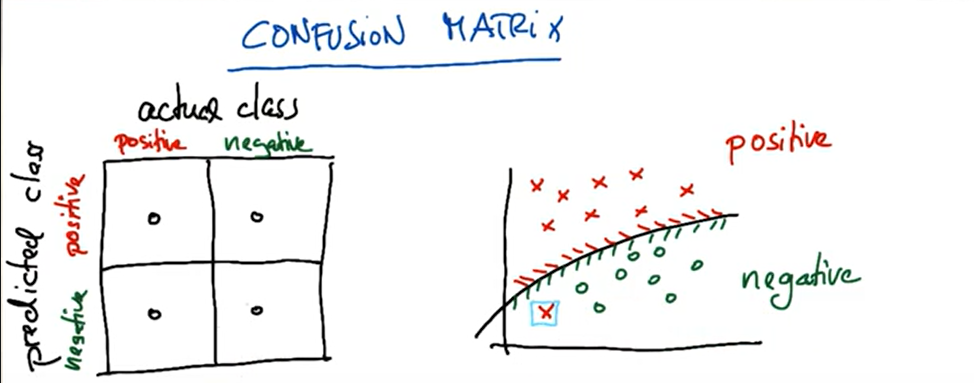

For this one, it is actually positive but was predicted/labeled as negative

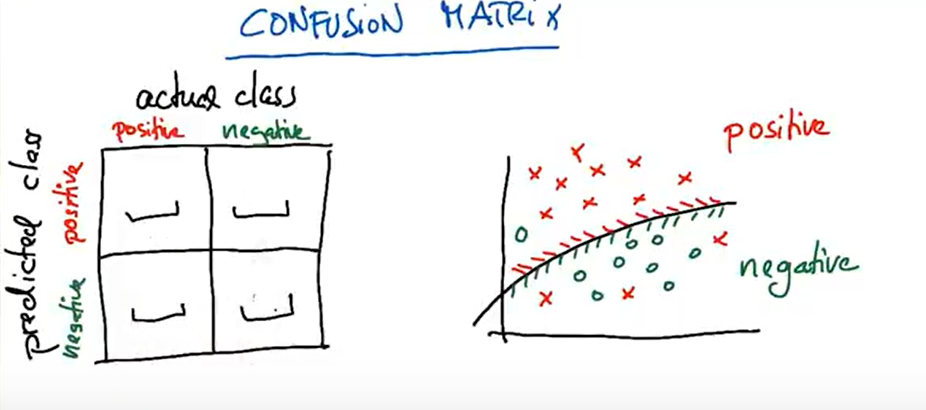

Now we want to count the number of points in each category for the confusion matrix above.

|  | Actual | |
|--------|---|---|
| **Predicted** | Pos | Neg |
| Pos | 9 | 1 |
| Neg | 3 | 8 |


False Alarms occur when the actual was negative, but predicted was positive

### Confusion Matrix for Eigenfaces

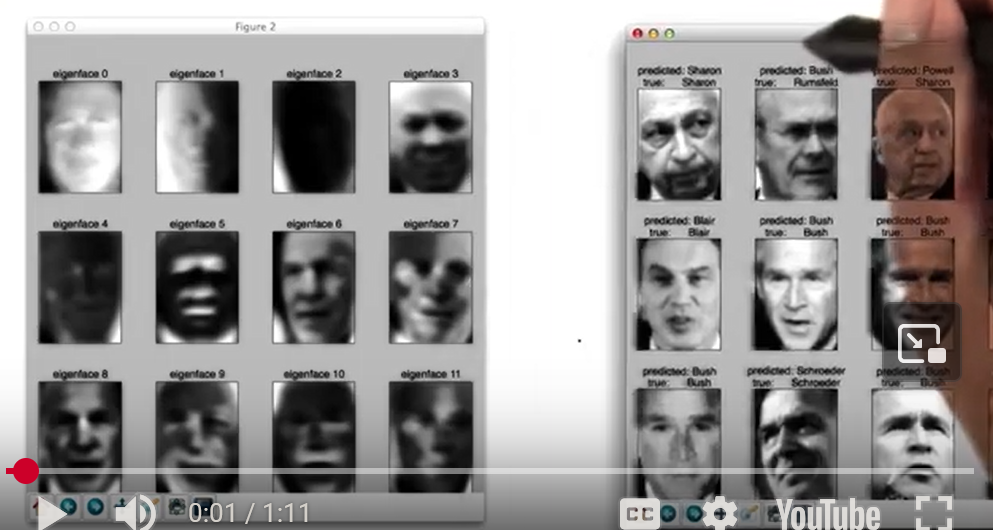

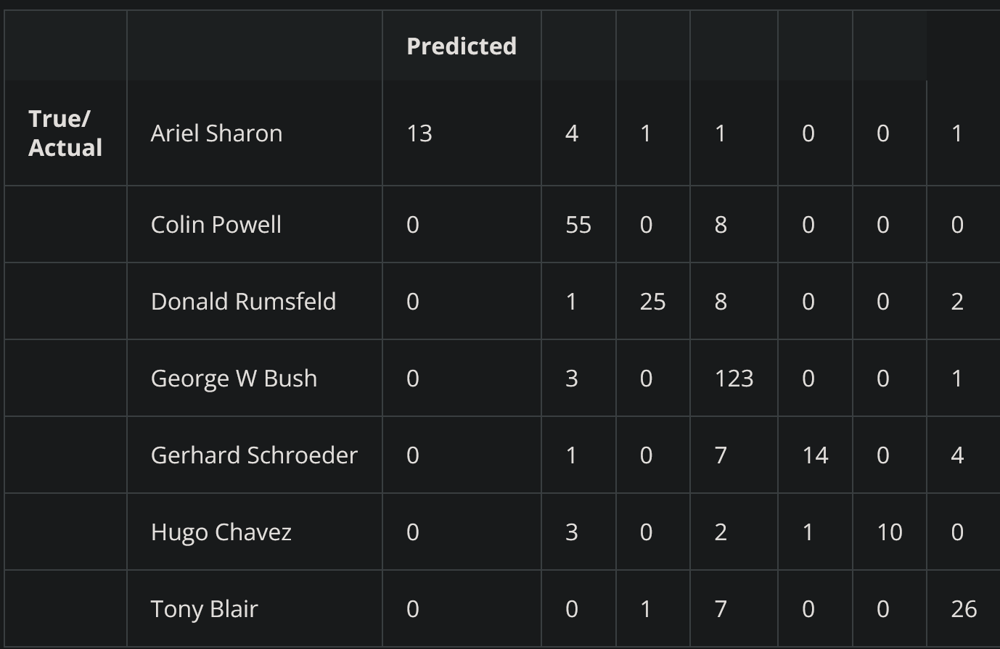

#### How Many Schroeders

For seeing how many Gerhard Schroeder images were shown/analyzed, you sum everything horizontally from the side of the Actual label. Then, to see how many times he was identified, you do it vertically from the Predicted label.

#### Classifying Chavez Correctly

What's the probability of classifying Hugo Chavez correctly?

Total Chavez shown: 16

Total correct guesses for Chavez: 10

`10/16 = .625`


Now, let's say that you run the learning algorithm and it predicts that an image is Hugo Chavez. What's the probability that the guess is actually Hugo Chavez?

guessed correct / total Chavez guesses

Total guessed correct: 10

Total Chavez guesses: 10

`10/10 = 1`

#### Precision and Recall

Recall = the 10/16 figure above (of the Hugo Chavez given, how many were correctly classified)

Precision = the 10/10 figure above (if guess Hugo Chavez, how often is it Hugo Chavez)

#### Powell Precision and Recall

Total Powell Guesses: 4+55+1+3+1+3 = 67

Total Correct Powell Guesses: 55

Total Powell Shown: 55+8 = 63

`Recall = total guesses/total shown = 55/63 = .87`

`Precision = correct guesses/total guesses = 55/67 = .82`

#### Bush P&R

Total Bush Guesses: 1+8+8+123+7+2+7 = 156

Total Correct Bush Guesses: 123

Total Bush Shown: 127

`Recall = total corret guesses/total shown = 123/127 = .97`

`Precision = correct guesses/total guesses = 123/156 = .79`

#### True Positives in Eigenfaces

True Positive
- Tony Blair: 26
  - 26 cases where something ID'd as Tony Blair was indeed him
- Rumsfield: 25

False Negative
- Tony Blair: 1+7 = 8 false negatives
  - 8 guesses that should have been Tony Blair were marked otherwise
- Rumsfield: 11

False Positive
- Tony Blair: 1+2+1+4 = 8 false positives
  - 8 guesses for Tony Blair that were not him.
- Rumsfield: 2

#### Equation for Precision

precision = $\frac{true pos}{true pos + false pos}$

recall = $\frac{true pos}{true pos + false neg}$

### Model Diagnostics in Python

In [251]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, accuracy_score, confusion_matrix

df = pd.read_csv('./datasets/admissions.csv')
df.head()

,admit,gre,gpa,prestige
0,0,380,3.61,3
1,1,660,3.67,3
2,1,800,4.00,1
3,1,640,3.19,4
4,0,520,2.93,4


In [ ]:
df[['p1', 'p2', 'p3', 'p4']] = pd.get_dummies(df['prestige'])

X = df[['gre', 'gpa', 'p1', 'p2', 'p3']]
y = df['admit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)


Now, to fit our model, we have to instatiate it

In [270]:
logit_mod = LogisticRegression(max_iter=1000)  #It's a LogisticRegression object
logit_mod.fit(X_train, y_train)  # fit model with your training data
y_preds = logit_mod.predict(X_test)  # predict y based on X_test data

To see how our model performed, we can use the metrics we imported earlier.

In [271]:
print(precision_score(y_test, y_preds))
print(recall_score(y_test, y_preds))
print(accuracy_score(y_test, y_preds))
confusion_matrix(y_test, y_preds)

0.3333333333333333
0.0625
0.575


array([[22,  2],
       [15,  1]])

Confusion Matrix layout:

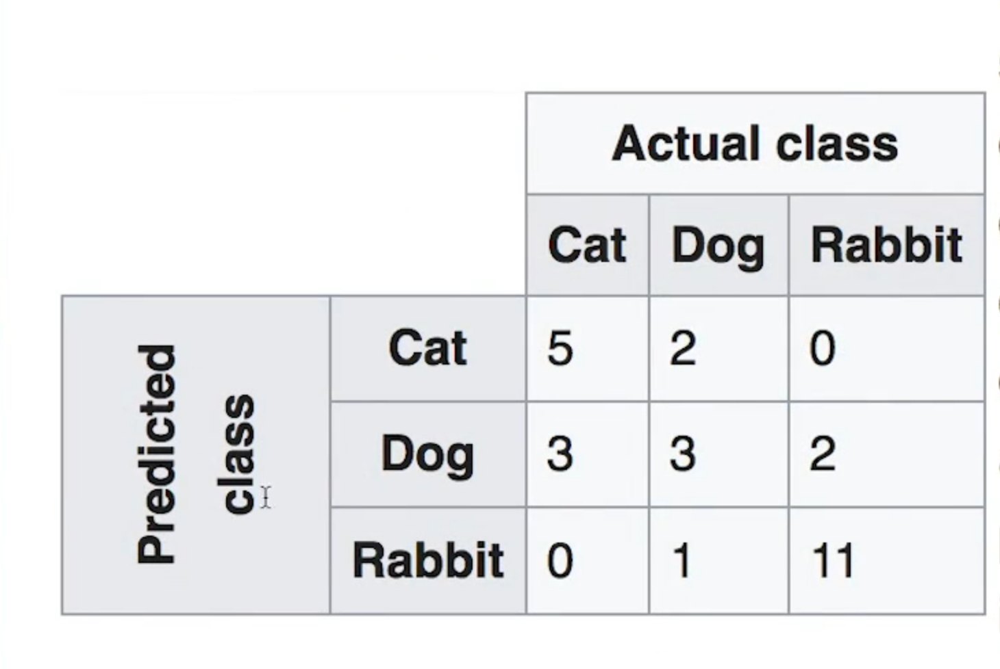

In [280]:
### Unless you install the ggplot library in the workspace, you will 
### get an error when running this code!

from ggplot import *
from sklearn.metrics import roc_curve, auc
%matplotlib inline

preds = logit_mod.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, preds)

df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))
ggplot(df, aes(x='fpr', y='tpr')) +\
    geom_line() +\
    geom_abline(linetype='dashed')

AttributeError: module 'pandas' has no attribute 'tslib'